In [1]:
import os
import sys

import pandas as pd
import numpy as np

from PIL import Image

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

from torchvision import transforms, utils
from torchvision.utils import save_image, make_grid

import cv2 

import matplotlib.pyplot as plt
from tqdm.auto import tqdm

In [2]:
IMAGES_DIR = 'edge_detection_results'
os.makedirs(IMAGES_DIR, exist_ok=True)

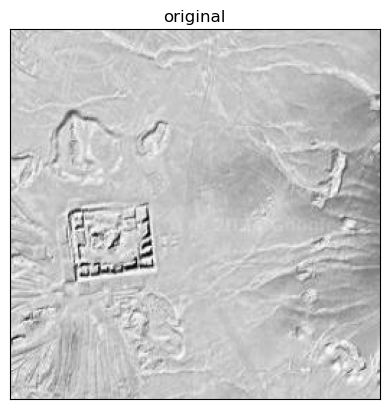

In [3]:
img = cv2.imread('../sample_data/positive_samples/000000.jpeg', cv2.IMREAD_GRAYSCALE)

plt.imshow(img, cmap='gray')
plt.title('original'), plt.xticks([]), plt.yticks([])
plt.savefig(f'{IMAGES_DIR}/original')

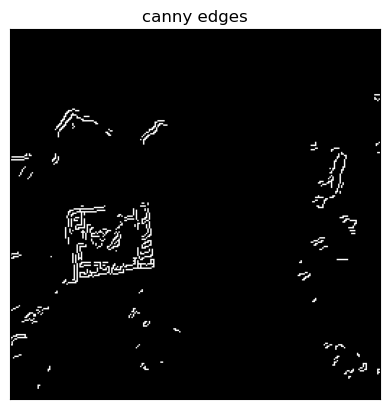

In [4]:
edges = cv2.Canny(img, 300, 400)

plt.imshow(edges, cmap='gray')
plt.title('canny edges'), plt.xticks([]), plt.yticks([])
plt.savefig(f'{IMAGES_DIR}/canny_edges')

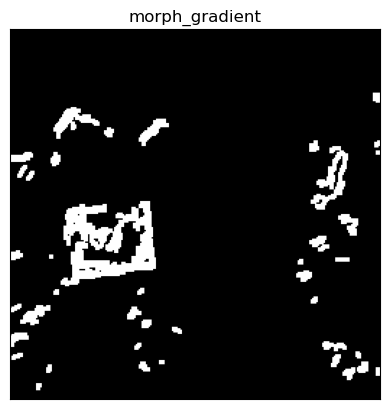

In [5]:
kernel = np.ones((3, 3), np.uint8) 
morph_gradient = cv2.morphologyEx(edges, cv2.MORPH_GRADIENT, kernel) 

plt.imshow(morph_gradient, cmap='gray')
plt.title('morph_gradient'), plt.xticks([]), plt.yticks([])
plt.savefig(f'{IMAGES_DIR}/morph_gradient')

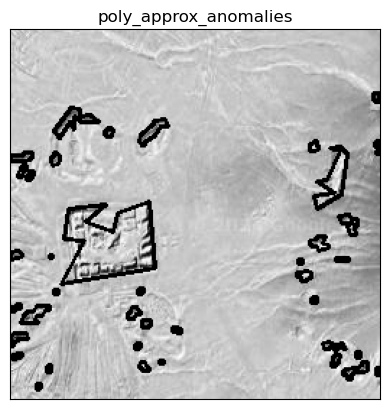

In [6]:
contours, hierarchy = cv2.findContours(morph_gradient, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE) 
output_image = img.copy()
anomaly_count = 0

for contour in contours:

    epsilon = 0.02 * cv2.arcLength(contour, True)
    approx = cv2.approxPolyDP(contour, epsilon, True)
    cv2.drawContours(output_image, [approx], -1, (0, 0, 255), 2)

plt.imshow(output_image, cmap='gray')
plt.title('poly_approx_anomalies'), plt.xticks([]), plt.yticks([])
plt.savefig(f'{IMAGES_DIR}/poly_approx_anomalies')

# Алгоритм нахождения аномалий на картинке

In [7]:
def plot_poly_contours(img):
    edges = cv2.Canny(img, 300, 400) 
    kernel = np.ones((3, 3), np.uint8) 
    morph_gradient = cv2.morphologyEx(edges, cv2.MORPH_GRADIENT, kernel) 
    contours, _ = cv2.findContours(morph_gradient, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE) 
    output_image = img.copy()
    for contour in contours:
        epsilon = 0.02 * cv2.arcLength(contour, True)
        approx = cv2.approxPolyDP(contour, epsilon, True)
        # vertices = len(approx)
        cv2.drawContours(output_image, [approx], -1, (0, 0, 255), 2)
    return output_image

# Применение алгоритма

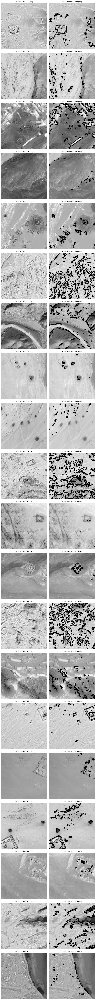

In [8]:
fig, axes = plt.subplots(20, 2, figsize=(10, 100))
image_paths = [f'../sample_data/positive_samples/{i:06d}.jpeg' for i in range(20)]

for ax_pair, img_path in zip(axes, image_paths):
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    output_image = plot_poly_contours(img)
    
    ax_pair[0].imshow(img, cmap='gray')
    ax_pair[0].set_title(f'Original: {img_path.split("/")[-1]}')
    ax_pair[0].axis('off')
    
    ax_pair[1].imshow(output_image, cmap='gray')
    ax_pair[1].set_title(f'Processed: {img_path.split("/")[-1]}')
    ax_pair[1].axis('off')

plt.tight_layout()
plt.savefig(f'{IMAGES_DIR}/positive_samples_poly_approx_anomalies')

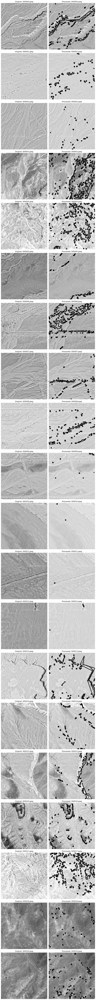

In [9]:
fig, axes = plt.subplots(20, 2, figsize=(10, 100))
image_paths = [f'../sample_data/negative_samples/{i:06d}.jpeg' for i in range(20)]

for ax_pair, img_path in zip(axes, image_paths):
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    output_image = plot_poly_contours(img)
    
    ax_pair[0].imshow(img, cmap='gray')
    ax_pair[0].set_title(f'Original: {img_path.split("/")[-1]}')
    ax_pair[0].axis('off')
    
    ax_pair[1].imshow(output_image, cmap='gray')
    ax_pair[1].set_title(f'Processed: {img_path.split("/")[-1]}')
    ax_pair[1].axis('off')

plt.tight_layout()
plt.savefig(f'{IMAGES_DIR}/negative_samples_poly_approx_anomalies')